# Concord analysis of kidney

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [ ]:
proj_name = "kidney_ransick"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/McMahon_kidney/GSE129798/"
data_dir = Path(data_dir)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cuda:3


'Dec04-1820'

In [4]:
# Read in the adata
#adata = sc.read(data_dir / "Ransick_adata.h5ad")
adata = sc.read(data_dir / "ransick_adata_processed_Dec04-1344.h5ad")

In [9]:
adata.obs.columns

Index(['nGene', 'nUMI', 'orig.ident', 'replicate', 'percent.mito', 'sex',
       'res.1', 'Lineages', 'Ontology_ID'],
      dtype='object')

### No batch correction, PCA and UMAP

In [18]:
adata.shape

(31265, 19125)

In [19]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
ccd.ul.score_cell_cycle(adata, organism='Mm')

In [20]:
n_pcs = 50
sc.pp.pca(adata, n_comps=n_pcs)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=n_pcs)
sc.tl.umap(adata, min_dist=0.1)

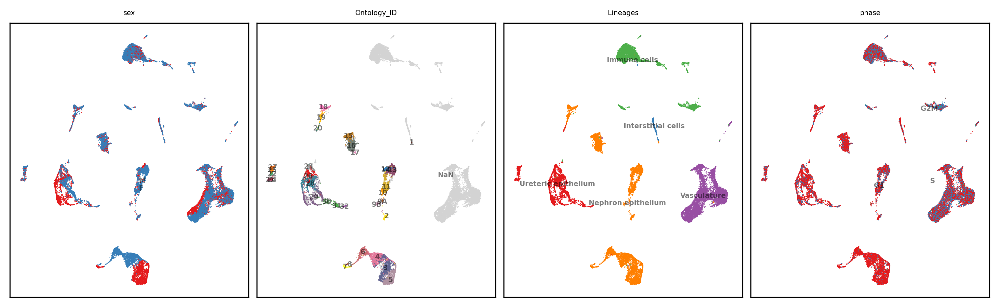

In [23]:
show_basis = 'X_umap'
show_cols = ['sex', 'Ontology_ID', 'Lineages', 'phase']

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

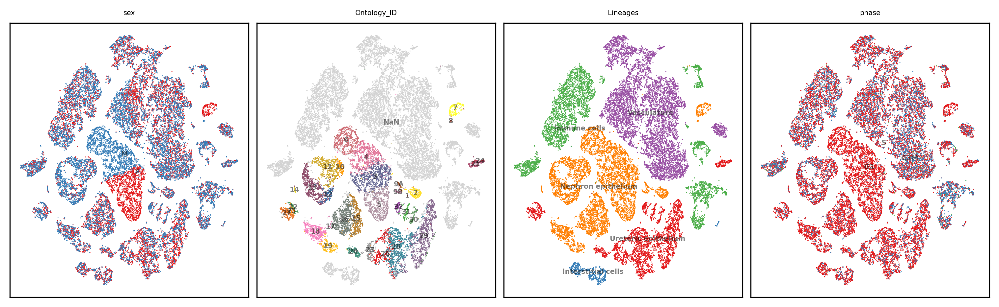

In [25]:
show_basis = 't-SNE [paper]'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

### Concord

In [9]:
output_key = f'Concord_{file_suffix}'
feature_list = ccd.ul.select_features(adata, n_top_features=10000, flavor='seurat_v3')
cur_ccd = ccd.Concord(adata=adata, input_feature=feature_list, 
                      domain_key=None, 
                      latent_dim=32,
                      n_epochs=10,
                      augmentation_mask_prob = 0.3, 
                      clr_temperature = .5, # Check out advanced usage to learn what this parameter controls, 
                      use_decoder=True,
                      seed=seed, 
                      inplace=False, 
                      verbose=False, 
                      device=device,
                      save_dir=save_dir) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key)

# Save the latent embedding to a filem, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")
adata.obsm = cur_ccd.adata.obsm # If not inplace

Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.
Concord.model.dataloader - WARNING - Only one domain found in the data. Setting p_intra_domain to 1.0.
p_intra_knn: 0.3


Epoch 0 Training: 488it [00:24, 19.55it/s, loss=3.48]
Epoch 9 Training: 100%|██████████| 488/488 [00:23<00:00, 20.81it/s, loss=3.3] 


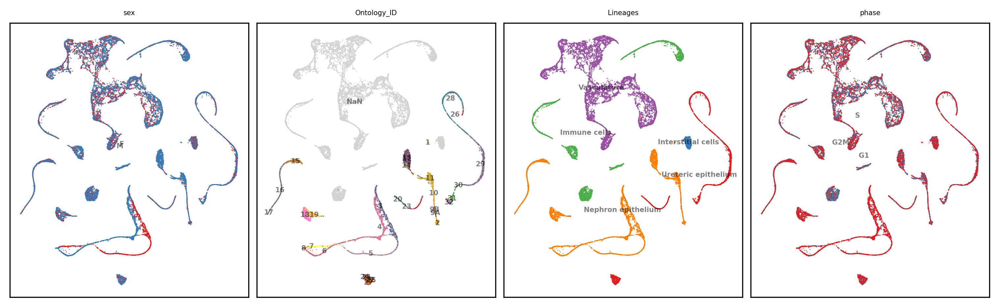

In [10]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
show_cols = ['sex', 'Ontology_ID', 'Lineages', 'phase']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [11]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
col = 'Lineages'
show_basis = f'{output_key}_UMAP_3D'
ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=1000
    )

In [13]:
#ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
col = 'sex'
show_basis = f'{output_key}_UMAP_3D'
ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=1000
    )

In [14]:
#ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
col = 'Ontology_ID'
show_basis = f'{output_key}_UMAP_3D'
ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=1000
    )

In [12]:

adata.write_h5ad(data_dir / f"ransick_adata_processed_{file_suffix}.h5ad")

file_suffix

'Dec04-1820'